<a href="https://colab.research.google.com/github/katejkpark/torontocrime/blob/master/Toronto_Crime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.offline import iplot
import plotly.graph_objs as go

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
df = pd.read_csv('Neighbourhood_Crime_Rates_Boundary_File_-1.csv')

In [0]:
df.head()

,OBJECTID,Neighbourhood,Hood_ID,Population,Assault_2014,Assault_2015,Assault_2016,Assault_2017,Assault_2018,Assault_2019,Assault_AVG,Assault_CHG,Assault_Rate_2019,AutoTheft_2014,AutoTheft_2015,AutoTheft_2016,AutoTheft_2017,AutoTheft_2018,AutoTheft_2019,AutoTheft_AVG,AutoTheft_CHG,AutoTheft_Rate_2019,BreakandEnter_2014,BreakandEnter_2015,BreakandEnter_2016,BreakandEnter_2017,BreakandEnter_2018,BreakandEnter_2019,BreakandEnter_AVG,BreakandEnter_CHG,BreakandEnter_Rate_2019,Homicide_2014,Homicide_2015,Homicide_2016,Homicide_2017,Homicide_2018,Homicide_2019,Homicide_AVG,Homicide_CHG,Homicide_Rate_2019,Robbery_2014,Robbery_2015,Robbery_2016,Robbery_2017,Robbery_2018,Robbery_2019,Robbery_AVG,Robbery_CHG,Robbery_Rate_2019,TheftOver_2014,TheftOver_2015,TheftOver_2016,TheftOver_2017,TheftOver_2018,TheftOver_2019,TheftOver_AVG,TheftOver_CHG,TheftOver_Rate_2019,Shape__Area,Shape__Length
0,1,Yonge-St.Clair,97,12528,20,29,39,27,34,37,31.0,0.09,295.3,2,3,7,2,6,6,4.3,0.00,47.9,37,20,12,19,24,28,23.3,0.17,223.5,0,0,0,0,0,0,0.0,0.0,0.0,6,5,6,8,5,4,5.7,-0.20,31.9,4,5,8,0,3,6,4.3,1.00,47.9,1.161315e+06,5873.270582
1,2,York University Heights,27,27593,271,296,361,344,357,370,333.2,0.04,1340.9,105,100,105,92,92,144,106.3,0.57,521.9,107,139,98,105,122,108,113.2,-0.11,391.4,1,0,2,1,1,0,0.8,-1.0,0.0,59,84,70,75,88,79,75.8,-0.10,286.3,30,46,37,39,38,28,36.3,-0.26,101.5,1.324666e+07,18504.777326
2,3,Lansing-Westgate,38,16164,44,80,68,85,75,72,70.7,-0.04,445.4,19,22,27,26,16,32,23.7,1.00,198.0,34,27,41,42,50,39,38.8,-0.22,241.3,0,0,0,0,10,0,1.7,-1.0,0.0,11,5,9,17,35,11,14.7,-0.69,68.1,4,5,5,11,6,11,7.0,0.83,68.1,5.346186e+06,11112.109625
3,4,Yorkdale-Glen Park,31,14804,106,136,174,161,175,209,160.2,0.19,1411.8,63,53,41,52,63,61,55.5,-0.03,412.1,51,57,66,58,64,84,63.3,0.31,567.4,1,1,1,1,2,1,1.2,-0.5,6.8,23,21,24,35,44,42,31.5,-0.05,283.7,23,14,26,23,20,29,22.5,0.45,195.9,6.038326e+06,10079.426920
4,5,Stonegate-Queensway,16,25051,88,71,76,95,87,82,83.2,-0.06,327.3,34,29,12,32,31,34,28.7,0.10,135.7,71,45,49,49,39,64,52.8,0.64,255.5,0,0,0,0,0,0,0.0,0.0,0.0,21,14,16,26,25,22,20.7,-0.12,87.8,7,8,4,6,7,4,6.0,-0.43,16.0,7.946202e+06,11853.189878


In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   OBJECTID                 140 non-null    int64  
 1   Neighbourhood            140 non-null    object 
 2   Hood_ID                  140 non-null    int64  
 3   Population               140 non-null    int64  
 4   Assault_2014             140 non-null    int64  
 5   Assault_2015             140 non-null    int64  
 6   Assault_2016             140 non-null    int64  
 7   Assault_2017             140 non-null    int64  
 8   Assault_2018             140 non-null    int64  
 9   Assault_2019             140 non-null    int64  
 10  Assault_AVG              140 non-null    float64
 11  Assault_CHG              140 non-null    float64
 12  Assault_Rate_2019        140 non-null    float64
 13  AutoTheft_2014           140 non-null    int64  
 14  AutoTheft_2015           1

In [0]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
OBJECTID,140.0,7.050000e+01,4.055860e+01,1.000000,3.575000e+01,7.050000e+01,1.052500e+02,1.400000e+02
Hood_ID,140.0,7.050000e+01,4.055860e+01,1.000000,3.575000e+01,7.050000e+01,1.052500e+02,1.400000e+02
Population,140.0,1.951122e+04,1.003359e+04,6577.000000,1.201950e+04,1.674950e+04,2.385450e+04,6.591300e+04
Assault_2014,140.0,1.173500e+02,1.069690e+02,16.000000,5.375000e+01,8.500000e+01,1.412500e+02,7.380000e+02
Assault_2015,140.0,1.268857e+02,1.196135e+02,12.000000,5.725000e+01,9.200000e+01,1.522500e+02,8.260000e+02
Assault_2016,140.0,1.322000e+02,1.265010e+02,10.000000,5.750000e+01,9.700000e+01,1.662500e+02,8.880000e+02
Assault_2017,140.0,1.346071e+02,1.371681e+02,20.000000,5.875000e+01,9.400000e+01,1.595000e+02,9.050000e+02
Assault_2018,140.0,1.389357e+02,1.428838e+02,15.000000,5.875000e+01,9.350000e+01,1.675000e+02,9.100000e+02
Assault_2019,140.0,1.459000e+02,1.485005e+02,17.000000,6.200000e+01,9.950000e+01,1.720000e+02,9.160000e+02
Assault_AVG,140.0,1.326464e+02,1.289774e+02,18.500000,5.942500e+01,9.650000e+01,1.602000e+02,8.518000e+02


In [0]:
df.columns

Index(['OBJECTID', 'Neighbourhood', 'Hood_ID', 'Population', 'Assault_2014',
       'Assault_2015', 'Assault_2016', 'Assault_2017', 'Assault_2018',
       'Assault_2019', 'Assault_AVG', 'Assault_CHG', 'Assault_Rate_2019',
       'AutoTheft_2014', 'AutoTheft_2015', 'AutoTheft_2016', 'AutoTheft_2017',
       'AutoTheft_2018', 'AutoTheft_2019', 'AutoTheft_AVG', 'AutoTheft_CHG',
       'AutoTheft_Rate_2019', 'BreakandEnter_2014', 'BreakandEnter_2015',
       'BreakandEnter_2016', 'BreakandEnter_2017', 'BreakandEnter_2018',
       'BreakandEnter_2019', 'BreakandEnter_AVG', 'BreakandEnter_CHG',
       'BreakandEnter_Rate_2019', 'Homicide_2014', 'Homicide_2015',
       'Homicide_2016', 'Homicide_2017', 'Homicide_2018', 'Homicide_2019',
       'Homicide_AVG', 'Homicide_CHG', 'Homicide_Rate_2019', 'Robbery_2014',
       'Robbery_2015', 'Robbery_2016', 'Robbery_2017', 'Robbery_2018',
       'Robbery_2019', 'Robbery_AVG', 'Robbery_CHG', 'Robbery_Rate_2019',
       'TheftOver_2014', 'TheftOver_201

In [0]:
# Graphs for Each section of crime (Assault, AutoTheft, B&E, Homicide, Robbery, Theft) by year
assault_2014 = df['Assault_2014'].sum()
assault_2015 = df['Assault_2015'].sum()
assault_2016 = df['Assault_2016'].sum()
assault_2017 = df['Assault_2017'].sum()
assault_2018 = df['Assault_2018'].sum()
assault_2019 = df['Assault_2019'].sum()

index=[2014,2015,2016,2017,2018,2019]
assault_df = pd.DataFrame([assault_2014,assault_2015,assault_2016,assault_2017,assault_2018,assault_2019],columns = ['count'], index=index)

assault_df.reset_index(inplace = True)
assault_df.columns = ['Year', 'Count']

In [0]:
# Counts of Assaults (2014-2019)
fig = go.Figure(data=go.Bar(x=assault_df['Year'],y=assault_df['Count']))
fig.update_layout(title='Assaults Per Year', xaxis_title='Year',yaxis_title='Count')

In [0]:
# Counts of AutoTheft (2014-2019)
auto_2014 = df['AutoTheft_2014'].sum()
auto_2015 = df['AutoTheft_2015'].sum()
auto_2016 = df['AutoTheft_2016'].sum()
auto_2017 = df['AutoTheft_2017'].sum()
auto_2018 = df['AutoTheft_2018'].sum()
auto_2019 = df['AutoTheft_2019'].sum()

index=[2014,2015,2016,2017,2018,2019]
AutoTheft_df = pd.DataFrame([auto_2014,auto_2015,auto_2016,auto_2017,auto_2018,auto_2019],columns = ['count'], index=index)

AutoTheft_df.reset_index(inplace = True)
AutoTheft_df.columns = ['Year', 'Count']

In [0]:
fig = go.Figure(data=go.Bar(x=AutoTheft_df['Year'],y=AutoTheft_df['Count']))
fig.update_layout(title='AutoTheft Per Year', xaxis_title='Year',yaxis_title='Count')

In [0]:
# Counts of B&E (2014-2019)
be_2014 = df['BreakandEnter_2014'].sum()
be_2015 = df['BreakandEnter_2015'].sum()
be_2016 = df['BreakandEnter_2016'].sum()
be_2017 = df['BreakandEnter_2017'].sum()
be_2018 = df['BreakandEnter_2018'].sum()
be_2019 = df['BreakandEnter_2019'].sum()

index=[2014,2015,2016,2017,2018,2019]
be_df = pd.DataFrame([be_2014,be_2015,be_2016,be_2017,be_2018,be_2019],columns = ['count'], index=index)

be_df.reset_index(inplace = True)
be_df.columns = ['Year', 'Count']

fig = go.Figure(data=go.Bar(x=be_df['Year'],y=be_df['Count']))
fig.update_layout(title='B&E Per Year', xaxis_title='Year',yaxis_title='Count')

In [0]:
# Counts of Homicides (2014-2019)
hom_2014 = df['Homicide_2014'].sum()
hom_2015 = df['Homicide_2015'].sum()
hom_2016 = df['Homicide_2016'].sum()
hom_2017 = df['Homicide_2017'].sum()
hom_2018 = df['Homicide_2018'].sum()
hom_2019 = df['Homicide_2019'].sum()

index=[2014,2015,2016,2017,2018,2019]
hom_df = pd.DataFrame([hom_2014,hom_2015,hom_2016,hom_2017,hom_2018,hom_2019],columns = ['count'], index=index)

hom_df.reset_index(inplace = True)
hom_df.columns = ['Year', 'Count']

fig = go.Figure(data=go.Bar(x=hom_df['Year'],y=hom_df['Count']))
fig.update_layout(title='Homicides Per Year', xaxis_title='Year',yaxis_title='Count')

In [0]:
# Counts of Homicides (2014-2019)
rob_2014 = df['Robbery_2014'].sum()
rob_2015 = df['Robbery_2015'].sum()
rob_2016 = df['Robbery_2016'].sum()
rob_2017 = df['Robbery_2017'].sum()
rob_2018 = df['Robbery_2018'].sum()
rob_2019 = df['Robbery_2019'].sum()

index=[2014,2015,2016,2017,2018,2019]
rob_df = pd.DataFrame([rob_2014,rob_2015,rob_2016,rob_2017,rob_2018,rob_2019],columns = ['count'], index=index)

rob_df.reset_index(inplace = True)
rob_df.columns = ['Year', 'Count']

fig = go.Figure(data=go.Bar(x=rob_df['Year'],y=rob_df['Count']))
fig.update_layout(title='Robberies Per Year', xaxis_title='Year',yaxis_title='Count')

In [0]:
# Counts of Homicides (2014-2019)
theft_2014 = df['TheftOver_2014'].sum()
theft_2015 = df['TheftOver_2015'].sum()
theft_2016 = df['TheftOver_2016'].sum()
theft_2017 = df['TheftOver_2017'].sum()
theft_2018 = df['TheftOver_2018'].sum()
theft_2019 = df['TheftOver_2019'].sum()

index=[2014,2015,2016,2017,2018,2019]
theft_df = pd.DataFrame([theft_2014,theft_2015,theft_2016,theft_2017,theft_2018,theft_2019],columns = ['count'], index=index)

theft_df.reset_index(inplace = True)
theft_df.columns = ['Year', 'Count']

fig = go.Figure(data=go.Bar(x=theft_df['Year'],y=theft_df['Count']))
fig.update_layout(title='Theft Per Year', xaxis_title='Year',yaxis_title='Count')

In [0]:
# Neighbourhood Vs. Population Vs. Assault
import plotly.express as px
crime_list = ['Assault_AVG','AutoTheft_AVG','BreakandEnter_AVG','Homicide_AVG','Robbery_AVG','TheftOver_AVG']
px.scatter(df, x="Neighbourhood", y=crime_list[0], color='Population',title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
px.scatter(df, x="Neighbourhood", y=crime_list[1],color='Population',title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
px.scatter(df, x="Neighbourhood", y=crime_list[2], color='Population',title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
px.scatter(df, x="Neighbourhood", y=crime_list[3], color='Population',title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
px.scatter(df, x="Neighbourhood", y=crime_list[4], color='Population',title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
px.scatter(df, x="Neighbourhood", y=crime_list[5], color='Population',title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
pt = pd.pivot_table(df,index='Neighbourhood',values=['Assault_AVG','AutoTheft_AVG','Robbery_AVG','BreakandEnter_AVG','Homicide_AVG','TheftOver_AVG'])
pt.reset_index(inplace=True)
pt

,Neighbourhood,Assault_AVG,AutoTheft_AVG,BreakandEnter_AVG,Homicide_AVG,Robbery_AVG,TheftOver_AVG
0,Agincourt North,74.8,29.7,53.5,0.2,30.2,4.7
1,Agincourt South-Malvern West,117.8,36.7,79.8,0.2,27.3,13.3
2,Alderwood,36.3,16.2,24.7,0.2,6.8,6.8
3,Annex,246.3,22.0,147.5,0.5,40.8,29.5
4,Banbury-Don Mills,80.5,21.8,73.2,0.0,15.0,10.3
...,...,...,...,...,...,...,...
135,Wychwood,70.2,13.2,34.0,0.3,13.8,2.3
136,Yonge-Eglinton,75.8,9.0,28.0,0.3,19.5,4.8
137,Yonge-St.Clair,31.0,4.3,23.3,0.0,5.7,4.3
138,York University Heights,333.2,106.3,113.2,0.8,75.8,36.3


In [0]:
px.scatter(df, x="Neighbourhood", y="Population", color="Assault_AVG",title='Neighbourhood Vs. Population Vs. Crime')

In [0]:
assault = pt['Assault_AVG'].sum()
auto = pt['AutoTheft_AVG'].sum()
be = pt['BreakandEnter_AVG'].sum()
homi = pt['Homicide_AVG'].sum()
rob = pt['Robbery_AVG'].sum()
theft = pt['TheftOver_AVG'].sum()

crime_df = pd.DataFrame([assault,auto,be,homi,rob,theft], columns = ['Count'], index = ['Assault','AutoTheft','B&E','Homicides','Robbery','Theft'])
crime_df.reset_index(inplace=True)
crime_df.columns = ['Crime','Count']

In [0]:
px.pie(crime_df,values='Count',names='Crime')

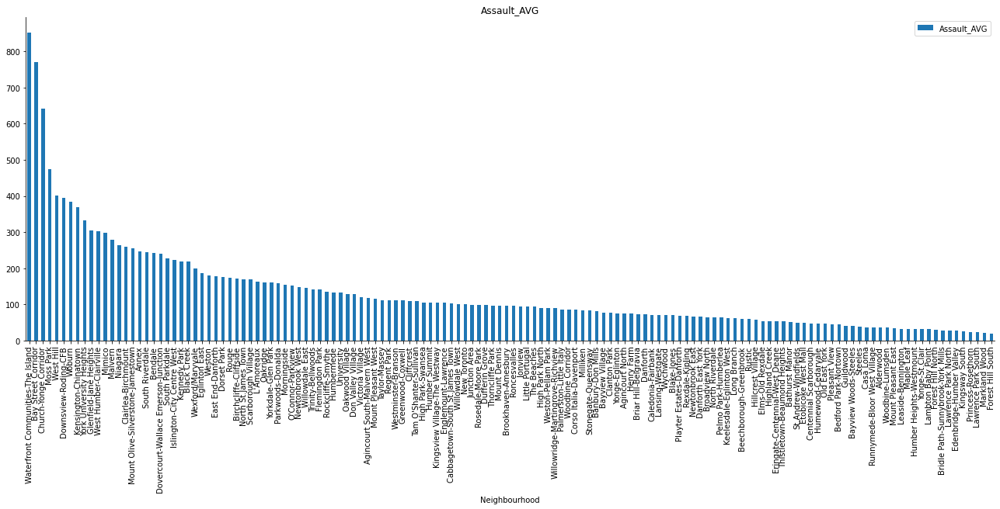

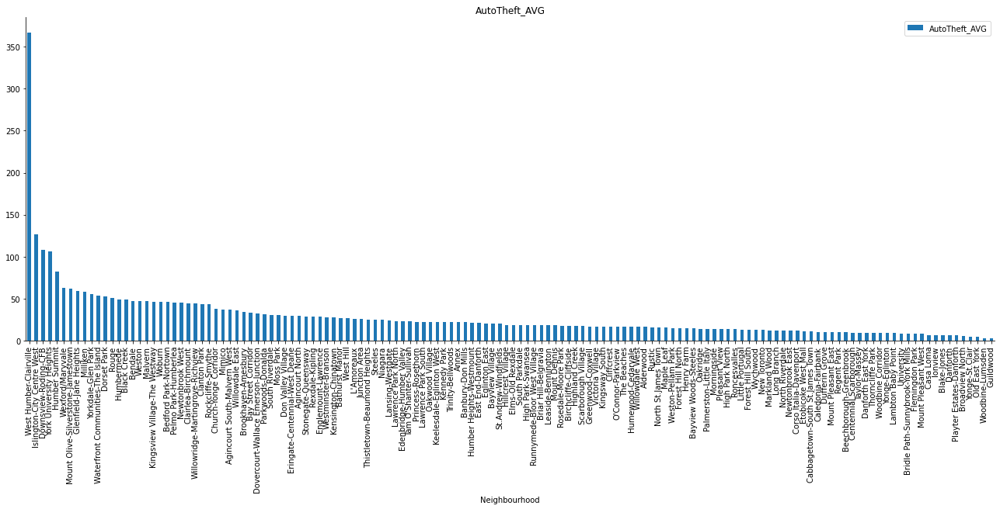

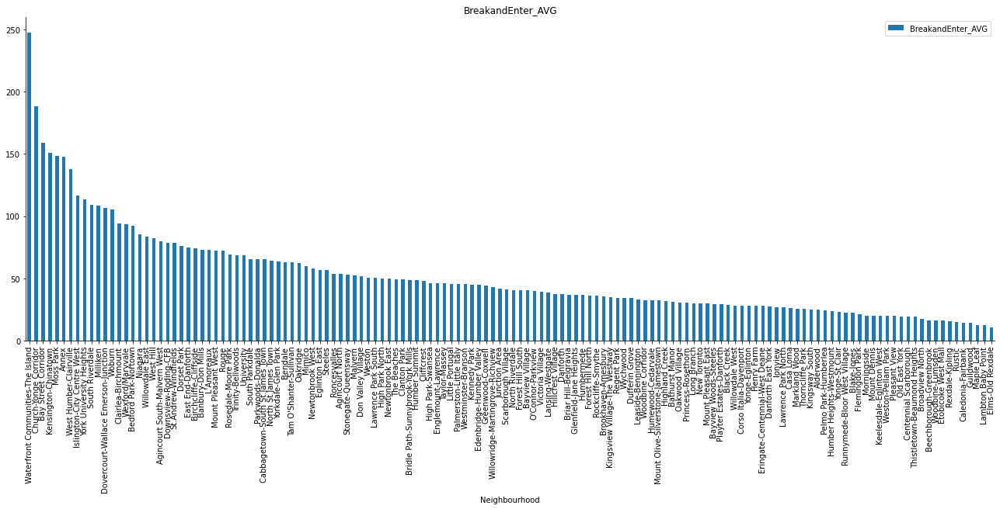

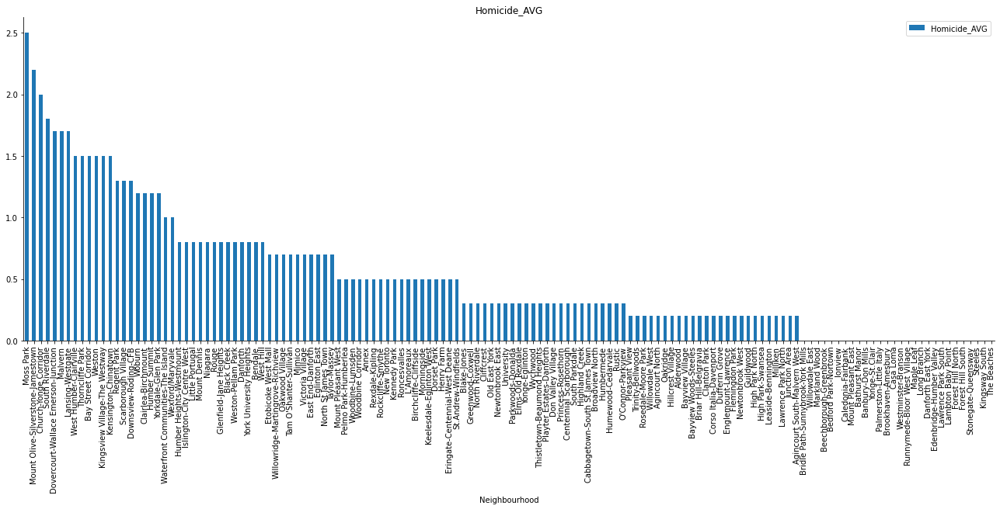

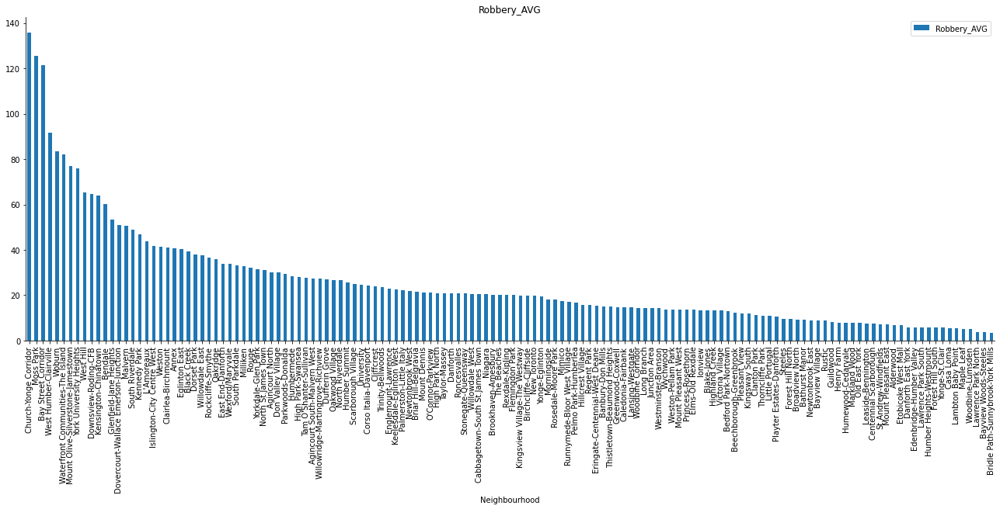

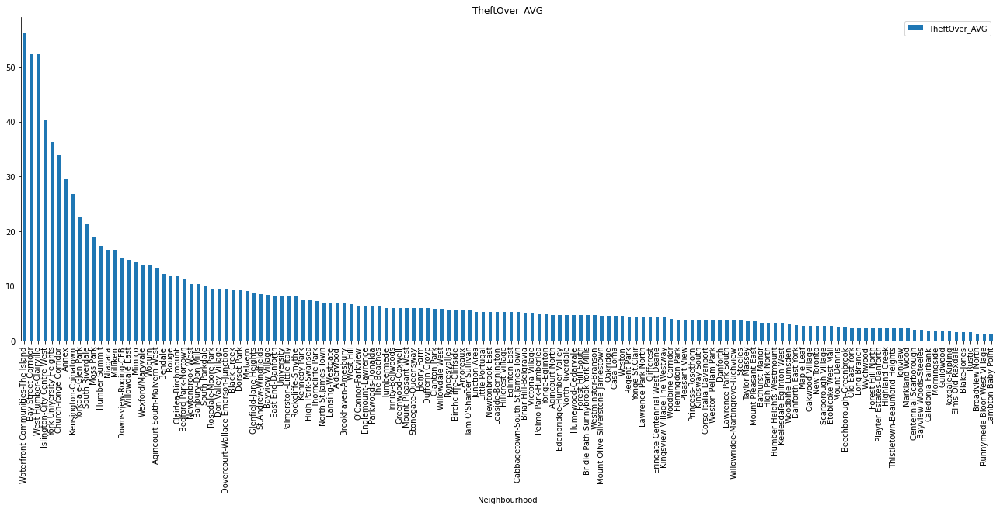

In [0]:
# Graphs for the average crime in different neighbourhoods
crime_list = ['Assault_AVG','AutoTheft_AVG','BreakandEnter_AVG','Homicide_AVG','Robbery_AVG','TheftOver_AVG']
for i in crime_list:
  pd.pivot_table(df,index='Neighbourhood',values = i).sort_values(by=i,ascending = False).plot(kind='bar',figsize=(18,9))
  plt.tight_layout()
  sns.despine()
  plt.title(i)

In [0]:
#  Number of autotheft in 2019 by each neighbourhood
piv = pd.pivot_table(df, index='Neighbourhood', values='AutoTheft_2019').sort_values(by='AutoTheft_2019',ascending=False)
piv.reset_index(inplace=True)

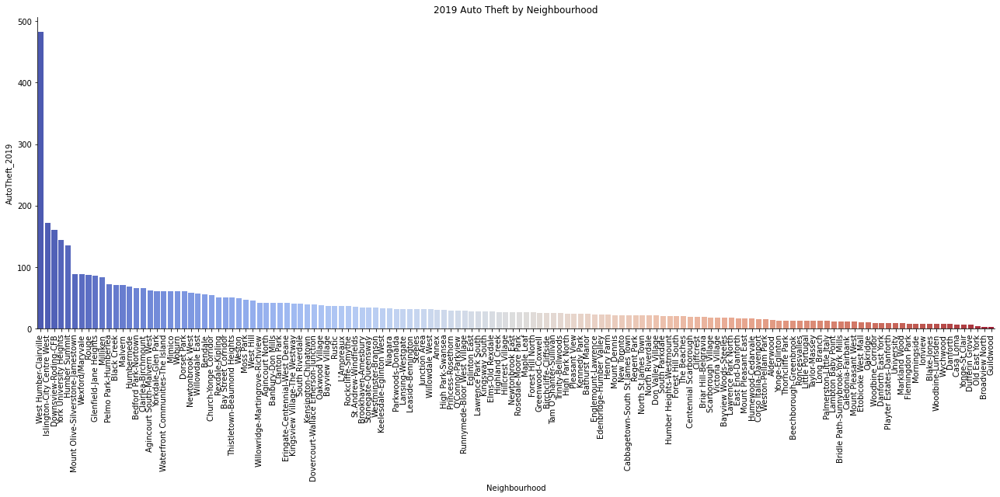

In [0]:
plt.figure(figsize=(18,9))
sns.barplot(x='Neighbourhood',y='AutoTheft_2019',data=piv,palette='coolwarm').set_title('2019 Auto Theft by Neighbourhood')
plt.xticks(rotation=90)
sns.despine()
plt.tight_layout()

In [0]:
# Number of assaults in 2019 by each neighbourhood 
pt = pd.pivot_table(df, index='Neighbourhood', values='Assault_2019').sort_values(by='Assault_2019',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Assaults in 2019')

In [0]:
# Number of break and enter in 2019 by each neighbourhood 
pt = pd.pivot_table(df, index='Neighbourhood', values='BreakandEnter_2019').sort_values(by='BreakandEnter_2019',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Break and Enter in 2019')

In [0]:
# Number of robbery in 2019 by each neighbourhood 
pt = pd.pivot_table(df, index='Neighbourhood', values='Robbery_2019').sort_values(by='Robbery_2019',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Robbery in 2019')

In [0]:
# Number of theft in 2019 by each neighbourhood 
pt = pd.pivot_table(df, index='Neighbourhood', values='TheftOver_2019').sort_values(by='TheftOver_2019',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Theft in 2019')

In [0]:
# Number of homicide in 2019 by each neighbourhood 
pt = pd.pivot_table(df, index='Neighbourhood', values='Homicide_2019').sort_values(by='Homicide_2019',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Homicide in 2019')

In [0]:
# Number of assaults in 2018 by each neighbourhood
pt = pd.pivot_table(df, index='Neighbourhood', values='Assault_2018').sort_values(by='Assault_2018', ascending=False)
pt

In [0]:
pt.plot(kind='bar', figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Assaults in 2018')

In [0]:
# Number of autothefts in 2018 by each neighbourhood
pt = pd.pivot_table(df, index='Neighbourhood', values='AutoTheft_2018').sort_values(by='AutoTheft_2018',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of AutoThefts in 2018')

In [0]:
# Number of break and enters in 2018 by each neighbourhood
pt = pd.pivot_table(df, index='Neighbourhood',values='BreakandEnter_2018').sort_values(by='BreakandEnter_2018',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Break and Enters in 2018')

In [0]:
# Number of robbery in 2018 by each neighbourhood
pt = pd.pivot_table(df,index='Neighbourhood', values='Robbery_2018').sort_values(by='Robbery_2018', ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Robbery in 2018')

In [0]:
# Number of thefts in 2018 by each neighbourhood
pt = pd.pivot_table(df, index='Neighbourhood', values='TheftOver_2018').sort_values(by='TheftOver_2018',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Thefts in 2018')

In [0]:
# Number of homicides in 2018 by each neighbourhood
pt = pd.pivot_table(df, index='Neighbourhood', values='Homicide_2018').sort_values(by='Homicide_2018',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Homicides in 2018')

In [0]:
# Number of assaults in 2017 by each neighbourhood
pt = pd.pivot_table(df, index='Neighbourhood', values='Assault_2017').sort_values(by='Assault_2017',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Assaults in 2017')

In [0]:
# Number of autothefts in 2017 by each neighbourhood
pt= pd.pivot_table(df,index='Neighbourhood',values='AutoTheft_2017').sort_values(by='AutoTheft_2017',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of AutoThefts in 2017')

In [0]:
# Number of break and enters in 2017 by each neighbourhood
pt = pd.pivot_table(df,index='Neighbourhood',values='BreakandEnter_2017').sort_values(by='BreakandEnter_2017', ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Break and Enters in 2017')

In [0]:
# Number of robbery in 2017 by each neighbourhood
pt = pd.pivot_table(df,index='Neighbourhood',values='Robbery_2017').sort_values(by='Robbery_2017',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Robbery in 2017')

In [0]:
# Number of thefts in 2017 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood', value='TheftOver_2017').sort_values(by='TheftOver_2017',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Thefts in 2017')

In [0]:
# Number of homicides in 2017 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Homicide_2017').sort_values(by='Homicide_2017',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Homicide in 2017')

In [0]:
# Number of assaults in 2016 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood', value='Assault_2016').sort_values(by='Assault_2016',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Assaults in 2016')

In [0]:
# Number of autothefts in 2016 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='AutoTheft_2016').sort_values(by='AutoTheft_2016',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Autothefts in 2016')

In [0]:
# Number of break and enters in 2016 by each neighbourhood 
pt=pd.pivot_table(df,index='Neighbourhood',value='BreakandEnter_2016').sort_values(by='BreakandEnter_2016',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Break and Enters in 2016')

In [0]:
# Number of robbery in 2016 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Robbery_2016').sort_values(by='Robbery_2016',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Robbery in 2016')

In [0]:
# Number of thefts in 2016 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='TheftOver_2016').sort_values(by='TheftOver_2016',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Thefts in 2016')

In [0]:
# Number of homicides in 2016 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Homicide_2016').sort_values(by='Homicide_2016',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Homicides in 2016')

In [0]:
# Number of assaults in 2015 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Assault_2015').sort_values(by='Assault_2015',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Assaults in 2015')

In [0]:
# Number of autothefts in 2015 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='AutoTheft_2015').sort_values(by='AutoTheft_2015', ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of AutoThefts in 2015')

In [0]:
# Number of break and enters in 2015 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='BreakandEnter_2015').sort_values(by='BreakandEnter_2015',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Break and Enters in 2015')

In [0]:
# Number of robbery in 2015 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Robbery_2015').sort_values(by='Robbery_2015',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Robbery in 2015')

In [0]:
# Number of thefts in 2015 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='TheftOver_2015').sort_values(by='TheftOver_2015',ascending=False)
pt

NameError: ignored

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Thefts in 2015')

In [0]:
# Number of homicides in 2015 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Homicide_2015').sort_values(by='Homicide_2015',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Homicides in 2015')

In [0]:
# Number of assaults in 2014 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Assault_2014').sort_values(by='Assault_2014',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Numebr of Assaults in 2014')

In [0]:
# Number of autothefts in 2014 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='AutoTheft_2014').sort_values(by='AutoTheft_2014',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of AutoThefts in 2014')

In [0]:
# Number of break and enters in 2014 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='BreakandEnter_2014').sort_values(by='BreakandEnter_2014',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Break and Enters in 2014')

In [0]:
# Number of robbery in 2014 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Robbery_2014').sort_values(by='Robbery_2014',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Robbery in 2014')

In [0]:
# Number of thefts in 2014 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='TheftOver_2014').sort_values(by='TheftOver_2014',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Thefts in 2014')

In [0]:
# Number of homicides in 2014 by each neighbourhood
pt=pd.pivot_table(df,index='Neighbourhood',value='Homicide_2014').sort_values(by='Homicide_2014',ascending=False)
pt

In [0]:
pt.plot(kind='bar',figsize=(18,9))
plt.tight_layout()
sns.despine()
plt.title('Number of Homicides in 2014')

In [0]:
import folium
m = folium.Map(location=[43.6532, -79.3832])
toronto = 'Neighbourhood_Crime_Rates_(Boundary_File)_.geojson'

In [0]:
choropleth = folium.Choropleth(
    geo_data=toronto,
    data=df,
    columns=['Neighbourhood','Assault_AVG'],
    key_on = 'feature.properties.Neighbourhood',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Assaults by Neighbourhood',
).add_to(m)

choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['Neighbourhood']))
m

In [0]:
m = folium.Map(location=[43.6532, -79.3832])
toronto = 'Neighbourhood_Crime_Rates_(Boundary_File)_.geojson'

In [0]:
choropleth = folium.Choropleth(
    geo_data=toronto,
    data=df,
    columns=['Neighbourhood','AutoTheft_AVG'],
    key_on = 'feature.properties.Neighbourhood',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Auto Theft by Neighbourhood',
).add_to(m)
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['Neighbourhood']))
m

In [0]:
m = folium.Map(location=[43.6532, -79.3832])
toronto = 'Neighbourhood_Crime_Rates_(Boundary_File)_.geojson'

In [0]:
choropleth = folium.Choropleth(
    geo_data=toronto,
    data=df,
    columns=['Neighbourhood','BreakandEnter_AVG'],
    key_on = 'feature.properties.Neighbourhood',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='B&E by Neighbourhood',
).add_to(m)
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['Neighbourhood']))
m

In [0]:
m = folium.Map(location=[43.6532, -79.3832])
toronto = 'Neighbourhood_Crime_Rates_(Boundary_File)_.geojson'

In [0]:
choropleth = folium.Choropleth(
    geo_data=toronto,
    data=df,
    columns=['Neighbourhood','Homicide_AVG'],
    key_on = 'feature.properties.Neighbourhood',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Homicides by Neighbourhood',
).add_to(m)
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['Neighbourhood']))
m

In [0]:
m = folium.Map(location=[43.6532, -79.3832])
toronto = 'Neighbourhood_Crime_Rates_(Boundary_File)_.geojson'

In [0]:
choropleth = folium.Choropleth(
    geo_data=toronto,
    data=df,
    columns=['Neighbourhood','Robbery_AVG'],
    key_on = 'feature.properties.Neighbourhood',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Robberies by Neighbourhood',
).add_to(m)
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['Neighbourhood']))
m

In [0]:
m = folium.Map(location=[43.6532, -79.3832])
toronto = 'Neighbourhood_Crime_Rates_(Boundary_File)_.geojson'

In [0]:
choropleth = folium.Choropleth(
    geo_data=toronto,
    data=df,
    columns=['Neighbourhood','TheftOver_AVG'],
    key_on = 'feature.properties.Neighbourhood',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Theft by Neighbourhood',
).add_to(m)
choropleth.geojson.add_child(folium.features.GeoJsonTooltip(['Neighbourhood']))
m